# IMAGE FORMATION - SAMPLING AND QUANTIZATION

In [19]:
from PIL import Image
from skimage.io import imread
import scipy.fftpack as fp
from scipy import ndimage, signal
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np

## SAMPLING (Lấy mẫu)


### UP-SAMPLING



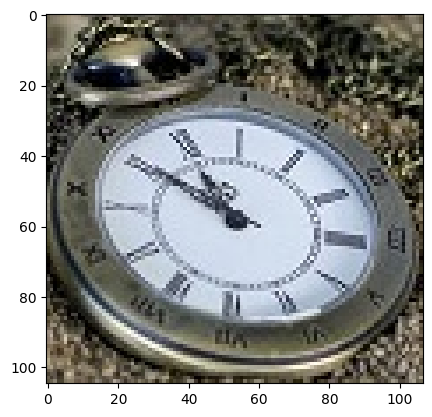

(<matplotlib.image.AxesImage at 0x2a403c62250>, None)

In [20]:
'''Nearest neighbour-based up-sampling có thể cho ảnh đầu ra kém chất lượng'''
# Mo anh va show anh tu duong dan
im = Image.open('../images/clock.jpg')
pylab.imshow(im), pylab.show()

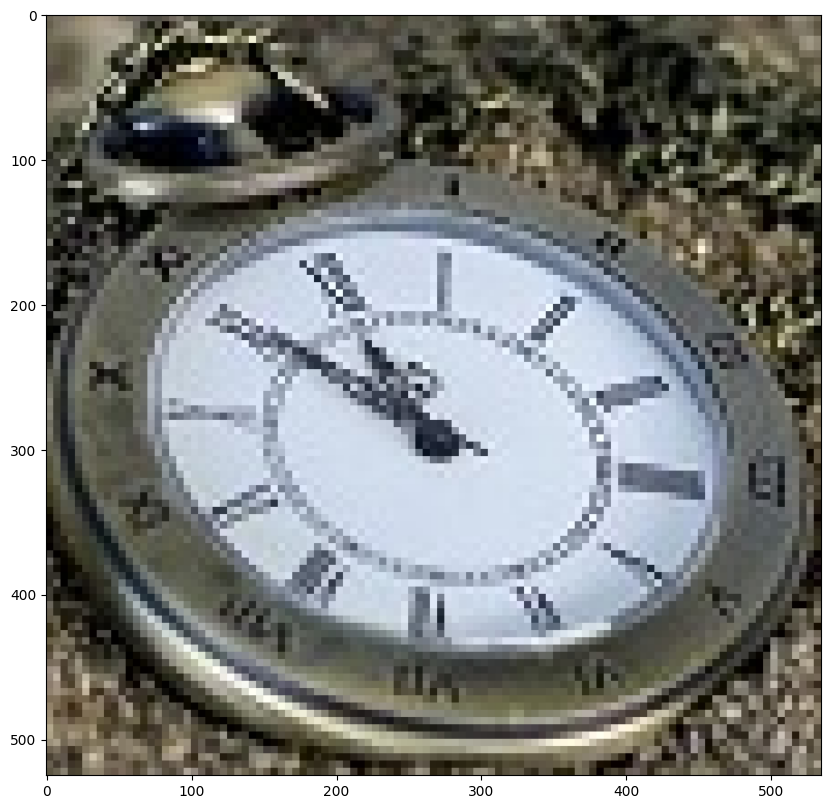

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [21]:
# Phong to anh len 25 lan
im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

## UP-SAMPLING VÀ PHÉP NỘI SUY (INTERPOLATION)

### NỘI SUY SONG TUYẾN TÍNH

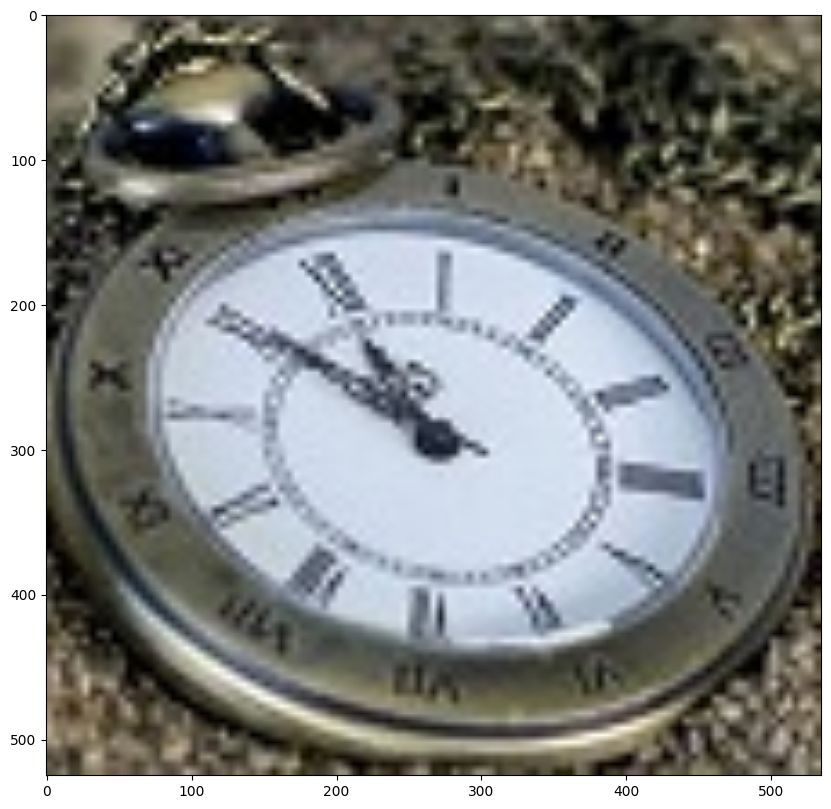

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [22]:
# Thuật toán Bi-linear interpolation
# Sử dụng hàm resize() từ PIL để làm bi - linear interpolation
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

### DOWN-SAMPLING


In [23]:
im = Image.open('../images/tajmahal.jpg')
im.show()

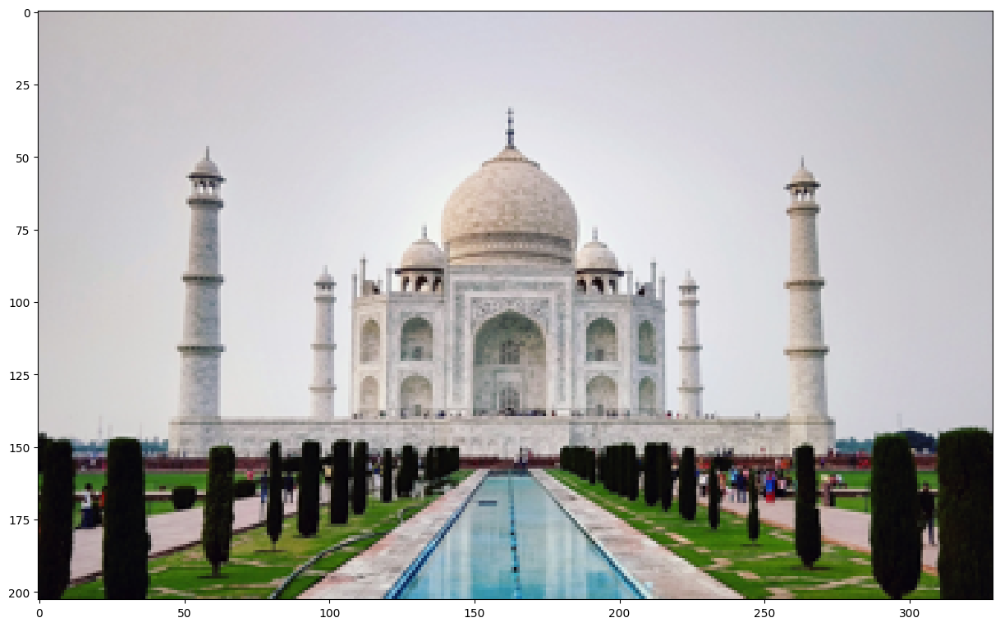

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [24]:
im = im.resize((im.width//5, im.height//5))
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

#### QUANTIZATION


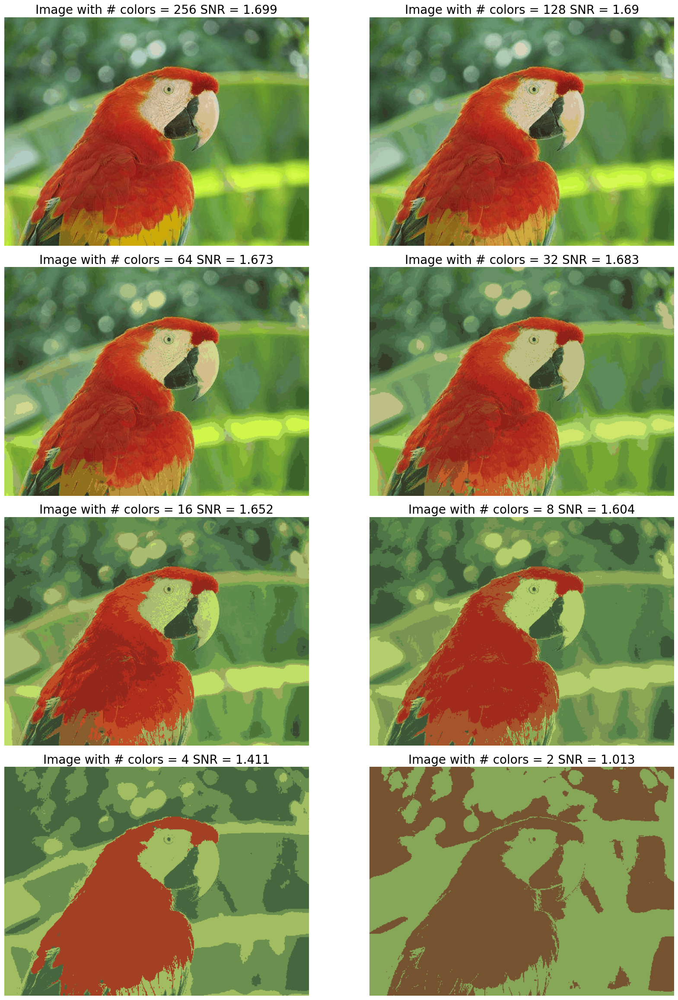

In [25]:
def signaltonoise(a, axis=0, ddof=0):
  mean = np.mean(a, axis=axis)
  std_dev = np.std(a, axis=axis, ddof=ddof)
  return np.where(std_dev == 0, 0, mean / std_dev)

im = Image.open('../images/parrot.jpg')
pylab.figure(figsize=(20,30))
num_colors_list = [1 << n for n in range(8,0,-1)]
snr_list = []
i = 1
for num_colors in num_colors_list:
  im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
  pylab.subplot(4,2,i), pylab.imshow(im1), pylab.axis('off')
  snr_list.append(signaltonoise(im1, axis=None))
  pylab.title('Image with # colors = ' + str(num_colors) + ' SNR = ' +
  str(np.round(snr_list[i-1],3)), size=20)
  i += 1
pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

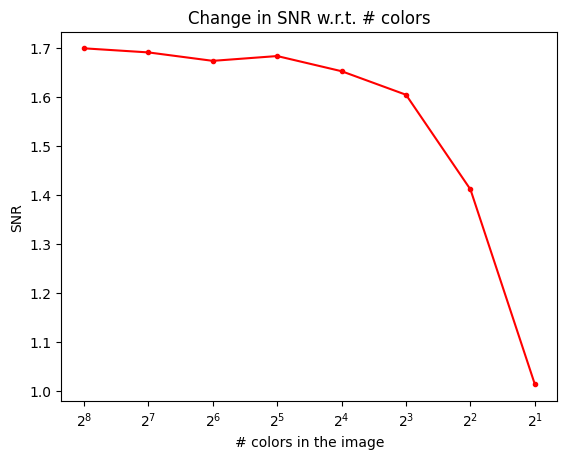

In [26]:
pylab.plot(num_colors_list, snr_list, 'r.-')
pylab.xlabel('# colors in the image')
pylab.ylabel('SNR')
pylab.title('Change in SNR w.r.t. # colors')
pylab.xscale('log', base=2)
pylab.gca().invert_xaxis()
pylab.show()



# Discrete Fourier Transform

### Thuật toán Fast Fourier Transform để tính DFT
#### FFT với module scipy.fftpack

SNR for the original image = 2.0323399414159278
SNR for the image obtained after reconstruction = 2.0323399414159287


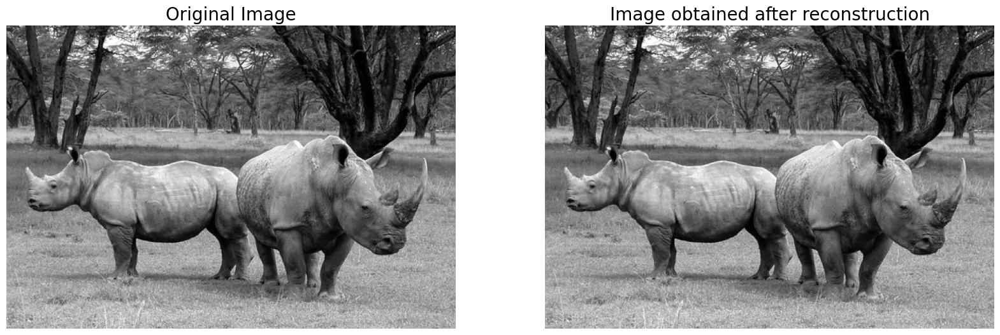

In [27]:
im = np.array(Image.open('../images/rhino.jpg').convert('L')) # we shall work with grayscale image
snr = signaltonoise(im, axis=None)
print('SNR for the original image = ' + str(snr))

# now call FFT and IFFT
freq = fp.fft2(im)
im1 = fp.ifft2(freq).real
snr = signaltonoise(im1, axis=None)
print('SNR for the image obtained after reconstruction = ' + str(snr))

assert(np.allclose(im, im1)) # make sure the forward and inverse FFT are close to each other
pylab.figure(figsize=(20,10))
pylab.subplot(121), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Original Image', size=20)
pylab.subplot(122), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
pylab.title('Image obtained after reconstruction', size=20)
pylab.show()

### Plotting the frequency spectrum


C:\Users\Admin\AppData\Local\Temp\ipykernel_4928\2071404519.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  freq2)).astype(int)), pylab.show()


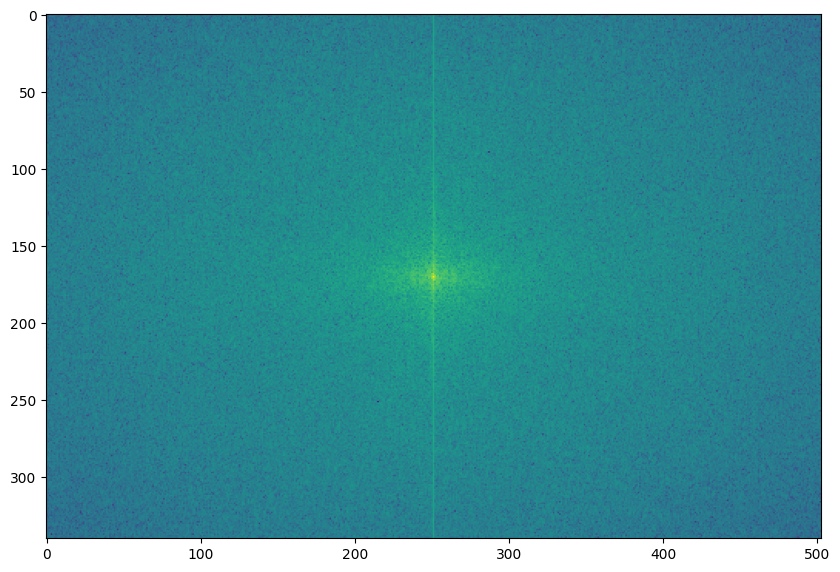

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [28]:
freq2 = fp.fftshift(freq)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 +
freq2)).astype(int)), pylab.show()

# HIỂU VỀ TÍCH CHẬP (CONVOLUTION)



0.9921568627450982
(256, 256)


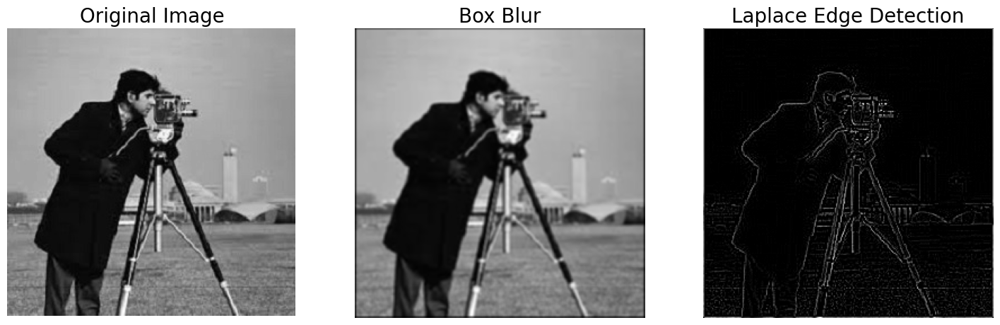

In [29]:
im = rgb2gray(imread('../images/cameraman.jpg')).astype(float)
print(np.max(im))
# 1.0
print(im.shape)
# (256, 256)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18, 6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
  ax.axis('off') # giúp loại bỏ trục tọa độ để hiển thị ảnh rõ ràng hơn.
pylab.show()

## ÁP DỤNG CONVOLUTION CHO ẢNH MÀU RGB

C:\Users\Admin\AppData\Local\Temp\ipykernel_4928\2027947864.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('../images/tajmahal.jpg')/255 # scale each pixel value in


1.0
(1018, 1645, 3)


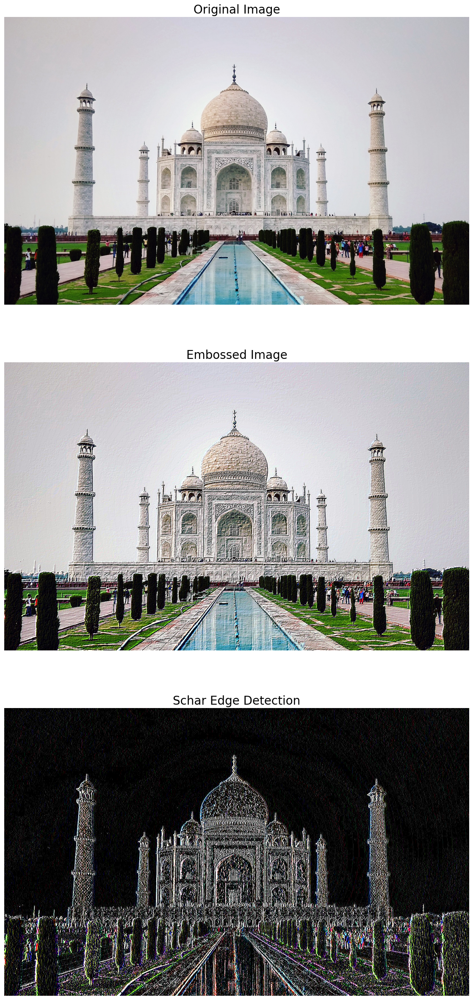

In [30]:
import imageio
im = imageio.imread('../images/tajmahal.jpg')/255 # scale each pixel value in
[0,1]
print(np.max(im))
print(im.shape)
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])
edge_schar_kernel = np.array([[ -3-3j, 0-10j, +3 -3j], [-10+0j, 0+ 0j,
+10+0j], [ -3+3j, 0+10j, +3 +3j]])
im_embossed = np.ones(im.shape)
im_edges = np.ones(im.shape)
for i in range(3):
  im_embossed[...,i] = np.clip(signal.convolve2d(im[...,i],
  emboss_kernel, mode='same', boundary="symm"),0,1)
for i in range(3):
  im_edges[:,:,i] = np.clip(np.real(signal.convolve2d(im[...,i],
  edge_schar_kernel, mode='same', boundary="symm")),0,1)
fig, axes = pylab.subplots(nrows=3, figsize=(20, 30))
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges)
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
  ax.axis('off')
pylab.show()

## TƯƠNG QUAN SO VỚI TÍCH CHẬP (CORRELATION VS CONVOLUTION)


C:\Users\Admin\AppData\Local\Temp\ipykernel_4928\941208068.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  lena_image = imageio.imread('../images/lena_g.png').mean(axis=2).astype(float)  # Ensure image is in grayscale and as float for precision


Image shape: (252, 281)


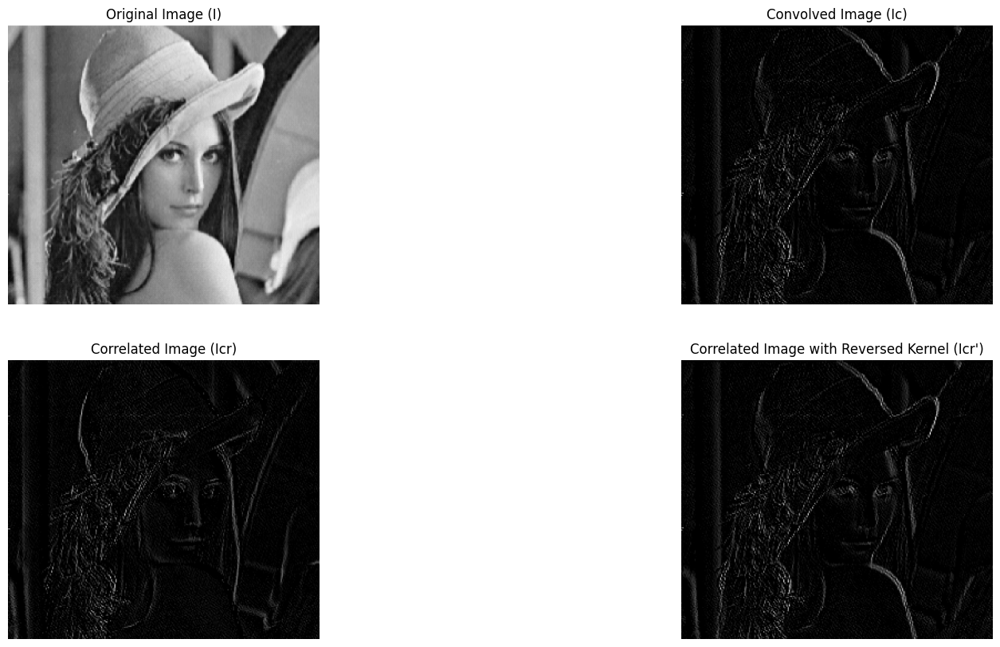

In [31]:
import numpy as np
from scipy import signal, misc
import matplotlib.pyplot as plt
import imageio

# Load and preprocess image
lena_image = imageio.imread('../images/lena_g.png').mean(axis=2).astype(float)  # Ensure image is in grayscale and as float for precision
print("Image shape:", lena_image.shape)

# Define the asymmetric ripple kernel
ripple_kernel = np.array([[0, -1, np.sqrt(2)],
                          [1, 0, -1],
                          [-np.sqrt(2), 1, 0]])

# Perform correlation
correlated_image = signal.correlate2d(lena_image, ripple_kernel, mode='same', boundary='symm')
correlated_image = np.clip(correlated_image, 0, 255)

# Perform convolution
convolved_image = signal.convolve2d(lena_image, ripple_kernel, mode='same', boundary='symm')
convolved_image = np.clip(convolved_image, 0, 255)

# Apply correlation with reversed kernel (equivalent to convolution with the kernel flipped)
reversed_kernel = np.flip(ripple_kernel)
correlated_reversed_image = signal.correlate2d(lena_image, reversed_kernel, boundary='symm', mode='same')
correlated_reversed_image = np.clip(correlated_reversed_image, 0, 255)

plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.imshow(lena_image, cmap='gray')
plt.title("Original Image (I)")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(convolved_image, cmap='gray')
plt.title("Convolved Image (Ic)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(correlated_image, cmap='gray')
plt.title("Correlated Image (Icr)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(correlated_reversed_image, cmap='gray')
plt.title("Correlated Image with Reversed Kernel (Icr')")
plt.axis('off')

plt.show()